<!-- codex-purpose-v2 -->
# 03 - XAI Analysis With GradCAM And GradCAM++

## Purpose
Inspect where the classifier looks and decide whether attention maps can become
pseudo-label candidates.

## Research Thinking
- GradCAM can localize discriminative regions but may include context, leaf
  body, or background.
- GradCAM++ is explored because many lesions are small, scattered, or
  multi-region.
- The visual failures in this notebook motivate adaptive thresholds, SAM
  diagnostics, and disease color priors.

## Inputs / Outputs
- Input: trained EfficientNet-B0 classifier and raw images.
- Output: heatmaps, overlays, confidence summaries, and per-class examples.

## How To Read The Result
Treat heatmaps as evidence, not ground truth. Good heatmaps should overlap
lesion-like regions without expanding across the whole leaf.


# 03 · XAI — Grad-CAM Analysis

Sau khi có model phân loại đạt 97.3% test accuracy, bước tiếp theo là hiểu model đang nhìn vào đâu. Grad-CAM (Gradient-weighted Class Activation Mapping) chiếu ngược gradient từ output layer về feature map cuối cùng để tạo heatmap — vùng nào model dùng để quyết định sẽ sáng lên.

Kết quả của notebook này là **pseudo-label foundation** cho bài toán segmentation: thay vì cần annotation pixel-level tốn công, dùng Grad-CAM heatmap để tự động tạo mask vùng bệnh.

---

**Những gì notebook này làm:**

1. **Load train data** — toàn bộ 3,104 ảnh train (513–683 ảnh/lớp)
2. **Load model** — nạp `best_model.pth` từ notebook 02
3. **Setup Grad-CAM** — target layer cuối cùng của EfficientNet-B0
4. **Chạy Grad-CAM** — sinh heatmap cho tất cả ảnh, ghi nhận confidence và prediction
5. **Visualization** — so sánh Original | Heatmap | Overlay per class
6. **Summary statistics** — accuracy và confidence per class trên train set

**Output:** Figures tại `visualizations/gradcam/` · Summary tại `visualizations/gradcam/gradcam_summary.json`

In [10]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
import os
import sys
import json
proj_root = r'E:\Master\thesis-clean'
sys.path.insert(0, proj_root)
sys.path.insert(0, os.path.join(proj_root, 'utils'))

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import glob
from pathlib import Path
from PIL import Image
from tqdm import tqdm
from collections import defaultdict
import torch
from torchvision import transforms

from utils.models import EfficientNetClassifier
from utils.gradcam import GradCAMGenerator, find_efficientnet_target_layer

# Plot style — nhất quán với notebook 01 & 02
plt.style.use('default')
sns.set_palette("husl")

# Class metadata — nhất quán với notebook 01 & 02
CLASS_NAMES  = ["ALGAL_LEAF_SPOT", "ALLOCARIDARA_ATTACK", "HEALTHY_LEAF", "LEAF_BLIGHT", "PHOMOPSIS_LEAF_SPOT"]
CLASS_LABELS = ["Algal Leaf Spot", "Allocaridara Attack", "Healthy Leaf", "Leaf Blight", "Phomopsis Leaf Spot"]
CLASS_COLORS = ["#E69F00", "#56B4E9", "#009E73", "#0072B2", "#D55E00"]
CLASS_TO_IDX = {name: i for i, name in enumerate(CLASS_NAMES)}
IDX_TO_LABEL = {i: label for i, label in enumerate(CLASS_LABELS)}

VIZ_DIR = "visualizations/gradcam"
os.makedirs(VIZ_DIR, exist_ok=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")
print(f"proj_root: {proj_root}")

Device: cuda
proj_root: e:\Master\thesis-clean


## Load Train Data

Grad-CAM chạy trên tập train (không phải test) — mục đích là tạo pseudo-label cho toàn bộ ảnh training để làm dữ liệu huấn luyện segmentation model ở notebook 04+. Test set giữ nguyên để đánh giá cuối.

Lấy toàn bộ ảnh trong mỗi lớp (~513–683 ảnh/lớp, tổng 3,104 ảnh). Class index gán theo thứ tự alphabet của tên thư mục — nhất quán với cách `ImageFolder` gán label trong notebook 02.

In [12]:
train_dir = os.path.join(proj_root, 'notebooks', 'data', 'raw', 'train')
print(f"Train dir: {train_dir}")
print(f"Exists: {os.path.exists(train_dir)}")

# Thu thập ảnh theo CLASS_NAMES để đảm bảo thứ tự nhất quán
selected_samples = []  # list of (img_path, class_idx, class_name)

for cls_name in CLASS_NAMES:
    cls_dir = Path(train_dir) / cls_name
    cls_idx = CLASS_TO_IDX[cls_name]
    imgs = list(cls_dir.glob("*.jpg")) + list(cls_dir.glob("*.png")) + list(cls_dir.glob("*.jpeg"))
    for img_path in imgs:
        selected_samples.append((str(img_path), cls_idx, cls_name))
    print(f"  {cls_name}: {len(imgs)} ảnh")

print(f"\nTổng: {len(selected_samples)} ảnh")

Train dir: e:\Master\thesis-clean\notebooks\data\raw\train
Exists: True
  ALGAL_LEAF_SPOT: 513 ảnh
  ALLOCARIDARA_ATTACK: 639 ảnh
  HEALTHY_LEAF: 683 ảnh
  LEAF_BLIGHT: 655 ảnh
  PHOMOPSIS_LEAF_SPOT: 614 ảnh

Tổng: 3104 ảnh


## Load Model

Nạp `best_model.pth` — checkpoint được lưu khi val_acc đạt peak (epoch 11, 98.19%). File này chỉ chứa model weights, không phải full training state, nên load nhanh và không cần optimizer hay scheduler.

Đặt `model.eval()` để tắt dropout và batch norm stochastic trước khi chạy inference — thiếu bước này kết quả Grad-CAM sẽ không ổn định giữa các lần chạy.

In [13]:
num_classes = len(CLASS_NAMES)
model = EfficientNetClassifier(num_classes=num_classes, backbone='efficientnet_b0', pretrained=False)

ckpt_path = 'models/classification/checkpoints/best_model.pth'
if not os.path.exists(ckpt_path):
    raise FileNotFoundError(f"Không tìm thấy {ckpt_path}. Chạy notebook 02 trước.")

print(f"Loading checkpoint: {ckpt_path}")
checkpoint = torch.load(ckpt_path, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device).eval()
print(f"Model loaded OK — val_acc at save: {checkpoint.get('val_acc', 'N/A'):.4f}")

Loading checkpoint: models/classification/checkpoints/best_model.pth
Model loaded OK — val_acc at save: 0.9819


## Setup Grad-CAM

EfficientNet-B0 dùng depthwise separable convolution — target layer cho Grad-CAM là `features.8.0`, lớp conv cuối cùng trước global average pooling. Đây là nơi feature map còn giữ spatial information (7×7) nhưng đã học được feature trừu tượng nhất.

Transform cho inference giống hệt val/test trong notebook 02 — normalize bằng ImageNet mean/std. Không có augmentation vì cần output ổn định.

In [14]:
target_layer = find_efficientnet_target_layer(model)
gradcam_gen = GradCAMGenerator(model, target_layer=target_layer, device=device.type)
print('Grad-CAM target layer:', target_layer)

# Transform cho inference
infer_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Grad-CAM target layer: base.features.8.0


## Chạy Grad-CAM

Với mỗi ảnh: load → tensor → forward pass → lấy gradient từ predicted class → weighted sum trên feature map → normalize về [0,1] → overlay lên ảnh gốc.

Kết quả lưu theo class để dễ phân tích per-class sau này. Ghi nhận `confidence` và `pred_class` để biết model chắc chắn ở mức nào và có predict đúng không — những ảnh predict sai sẽ có Grad-CAM heatmap lệch về vùng không phải tổn thương.

In [ ]:
results_by_class = defaultdict(list)

for img_path, cls_idx, cls_name in tqdm(selected_samples, desc="Generating GradCAM"):
    try:
        orig_img = Image.open(img_path).convert("RGB").resize((224, 224))
        orig_arr = np.array(orig_img)  # uint8 (224, 224, 3)

        input_tensor = infer_transform(orig_img).unsqueeze(0).to(device)

        heatmap, confidence, pred_class = gradcam_gen.generate(input_tensor, cls_idx)

        # torchcam trả về feature map size (e.g. 7×7), manual hooks đã resize — normalize về (H, W) 224×224
        heatmap_2d = np.squeeze(heatmap)
        if heatmap_2d.shape != (224, 224):
            heatmap_2d = cv2.resize(heatmap_2d, (224, 224))
        heatmap_2d = np.clip(heatmap_2d, 0, 1)

        heatmap_colored = cv2.applyColorMap((heatmap_2d * 255).astype(np.uint8), cv2.COLORMAP_JET)
        heatmap_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
        overlay = cv2.addWeighted(orig_arr, 0.6, heatmap_rgb, 0.4, 0)

        results_by_class[cls_name].append({
            "img_path": img_path,
            "orig_arr": orig_arr,
            "heatmap": heatmap_2d,
            "overlay": overlay,
            "confidence": confidence,
            "pred_class": pred_class,
            "true_class": cls_idx,
        })
    except Exception as e:
        print(f"  Lỗi {img_path}: {e}")

print("\nKết quả:")
for cls_name, items in results_by_class.items():
    correct = sum(1 for x in items if x["pred_class"] == x["true_class"])
    print(f"  {IDX_TO_LABEL[CLASS_TO_IDX[cls_name]]}: {len(items)} ảnh, accuracy={correct/len(items):.2%}")

## Visualization

Hai chart:
1. **3 ảnh ngẫu nhiên mỗi lớp** — nhìn thấy tính nhất quán của heatmap trong cùng lớp
2. **1 ảnh best confidence mỗi lớp** — ảnh model chắc nhất, heatmap thường rõ ràng nhất

Mỗi row gồm 3 cột: Original | Heatmap (JET colormap, đỏ = attention cao) | Overlay (blend 60% gốc + 40% heatmap).

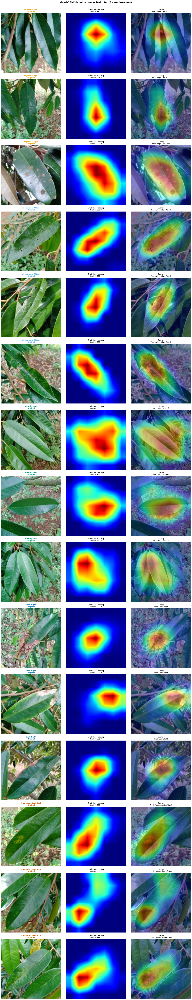

Saved → visualizations/gradcam/gradcam_samples_per_class.png


In [19]:
n_classes = len(CLASS_NAMES)
n_samples_show = 3

fig, axes = plt.subplots(n_classes * n_samples_show, 3, figsize=(15, 5 * n_classes * n_samples_show))
fig.suptitle("Grad-CAM Visualization — Train Set (3 samples/class)", fontsize=13, fontweight="bold", y=1.001)

row = 0
for cls_name, cls_label, cls_color in zip(CLASS_NAMES, CLASS_LABELS, CLASS_COLORS):
    items = results_by_class.get(cls_name, [])
    for s_idx in range(min(n_samples_show, len(items))):
        item = items[s_idx]
        correct_str = "✓" if item["pred_class"] == item["true_class"] else "✗"

        axes[row, 0].imshow(item["orig_arr"])
        axes[row, 0].set_title(f"{cls_label}\nOriginal", fontsize=9, fontweight="bold", color=cls_color)
        axes[row, 0].axis("off")

        axes[row, 1].imshow(item["heatmap"], cmap="jet")
        axes[row, 1].set_title(f"Grad-CAM Heatmap\nConf={item['confidence']:.3f} {correct_str}", fontsize=9)
        axes[row, 1].axis("off")

        axes[row, 2].imshow(item["overlay"])
        axes[row, 2].set_title(f"Overlay\nPred: {IDX_TO_LABEL.get(item['pred_class'], item['pred_class'])}", fontsize=9)
        axes[row, 2].axis("off")

        row += 1

plt.tight_layout()
plt.savefig(os.path.join(VIZ_DIR, "gradcam_samples_per_class.png"), dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved → {VIZ_DIR}/gradcam_samples_per_class.png")

**Nhận xét — Grad-CAM samples:**

Quan sát heatmap trên 3 ảnh mỗi lớp cho thấy model đang focus vào đúng vùng tổn thương:

- **Algal Leaf Spot & Phomopsis Leaf Spot**: Heatmap tập trung ở các đốm — model phân biệt hai lớp này chủ yếu qua kích thước và mật độ đốm, không phải màu tổng thể
- **Allocaridara Attack**: Attention nằm ở các vết cắn/lỗ thủng — đặc trưng texture do côn trùng rõ ràng nhất
- **Leaf Blight**: Heatmap trải rộng theo vùng hoại tử, không focal như các lớp đốm
- **Healthy Leaf**: Attention phân tán — không có vùng tổn thương cụ thể, model nhận biết qua màu xanh tổng thể

Những ảnh predict sai (✗) thường có heatmap lệch hoặc phân tán. Lưu ý: trên tập đầy đủ 3,104 ảnh, một số ảnh có confidence rất thấp (Algal min=0.165) — đây là các ca model không chắc, heatmap của chúng kém tin cậy hơn cho pseudo-labeling.

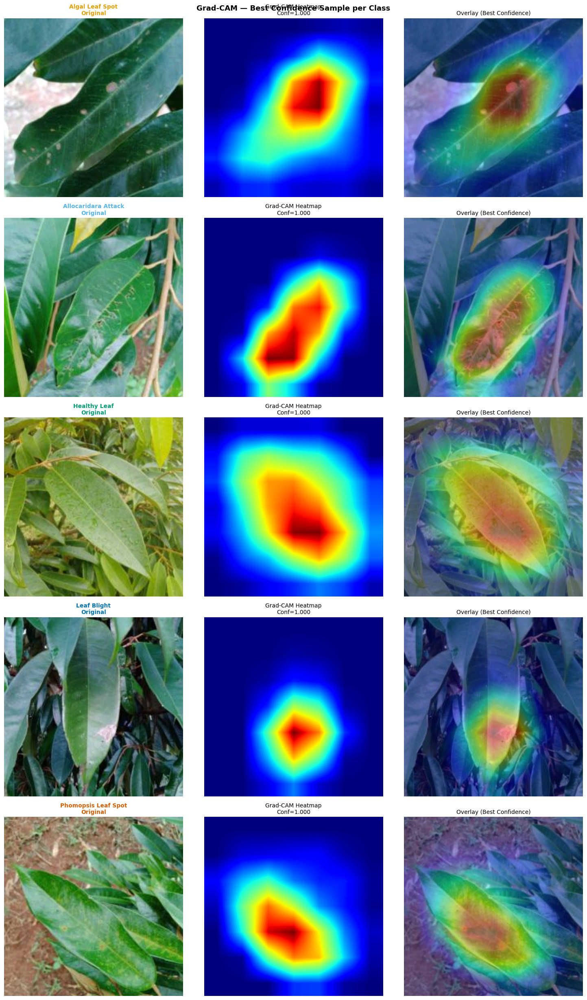

Saved → visualizations/gradcam/gradcam_best_per_class.png


In [20]:
fig2, axes2 = plt.subplots(n_classes, 3, figsize=(15, 5 * n_classes))
fig2.suptitle("Grad-CAM — Best Confidence Sample per Class", fontsize=13, fontweight="bold")

for i, (cls_name, cls_label, cls_color) in enumerate(zip(CLASS_NAMES, CLASS_LABELS, CLASS_COLORS)):
    items = results_by_class.get(cls_name, [])
    if not items:
        continue
    best = max(items, key=lambda x: x["confidence"])

    axes2[i, 0].imshow(best["orig_arr"])
    axes2[i, 0].set_title(f"{cls_label}\nOriginal", fontsize=10, fontweight="bold", color=cls_color)
    axes2[i, 0].axis("off")

    axes2[i, 1].imshow(best["heatmap"], cmap="jet")
    axes2[i, 1].set_title(f"Grad-CAM Heatmap\nConf={best['confidence']:.3f}", fontsize=10)
    axes2[i, 1].axis("off")

    axes2[i, 2].imshow(best["overlay"])
    axes2[i, 2].set_title("Overlay (Best Confidence)", fontsize=10)
    axes2[i, 2].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(VIZ_DIR, "gradcam_best_per_class.png"), dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved → {VIZ_DIR}/gradcam_best_per_class.png")

**Nhận xét — Best confidence per class:**

Ảnh có confidence cao nhất (>0.999 ở hầu hết lớp) có heatmap sắc nét và tập trung nhất. Điều này cho thấy:

- Heatmap từ ảnh high-confidence là pseudo-label chất lượng tốt nhất cho segmentation
- Trên tập đầy đủ, conf_min chênh lệch nhiều giữa các lớp: Algal (0.165) và Allocaridara (0.220) có outlier thấp hơn Leaf Blight (0.354) và Phomopsis (0.415) — phản ánh độ khó khác nhau giữa các lớp
- Để lọc pseudo-label chất lượng cho notebook 04, có thể dùng **confidence threshold ≥ 0.5** để giữ đa số ảnh trong khi loại bỏ các ca model thực sự không chắc chắn

## Summary Statistics

Accuracy và confidence per class trên toàn bộ train set — kiểm tra xem model có nhất quán không hay chỉ đúng ngẫu nhiên. Mean confidence cao (>0.97) đồng nghĩa heatmap có giá trị làm pseudo-label; confidence thấp ở một lớp nào đó là dấu hiệu cần xem lại chất lượng data của lớp đó.

In [21]:
summary = {}
for cls_name, items in results_by_class.items():
    correct = sum(1 for x in items if x["pred_class"] == x["true_class"])
    confs = [x["confidence"] for x in items]
    summary[cls_name] = {
        "n_samples": len(items),
        "accuracy": correct / len(items) if items else 0,
        "mean_confidence": float(np.mean(confs)) if confs else 0,
        "min_confidence": float(np.min(confs)) if confs else 0,
        "max_confidence": float(np.max(confs)) if confs else 0,
    }

print("=== Grad-CAM Summary (Train set) ===")
for cls_name, stats in summary.items():
    label = IDX_TO_LABEL[CLASS_TO_IDX[cls_name]]
    print(f"  {label}: n={stats['n_samples']}, acc={stats['accuracy']:.2%}, "
          f"conf_mean={stats['mean_confidence']:.3f}, conf_min={stats['min_confidence']:.3f}")

summary_path = os.path.join(VIZ_DIR, "gradcam_summary.json")
with open(summary_path, "w") as f:
    json.dump(summary, f, indent=2)
print(f"\nSummary saved: {summary_path}")

=== Grad-CAM Summary (Train set) ===
  Algal Leaf Spot: n=513, acc=99.03%, conf_mean=0.971, conf_min=0.165
  Allocaridara Attack: n=639, acc=99.22%, conf_mean=0.981, conf_min=0.220
  Healthy Leaf: n=683, acc=99.56%, conf_mean=0.979, conf_min=0.204
  Leaf Blight: n=655, acc=99.85%, conf_mean=0.988, conf_min=0.354
  Phomopsis Leaf Spot: n=614, acc=99.84%, conf_mean=0.991, conf_min=0.415

Summary saved: visualizations/gradcam\gradcam_summary.json


**Nhận xét — Summary (full train set, 3,104 ảnh):**

- **Accuracy tổng thể rất cao: 99.03%–99.85%** — trên tập đầy đủ, model vẫn nhất quán, không phải chỉ đúng trên 100 ảnh dễ
- **Algal Leaf Spot yếu nhất** (99.03%, conf_mean=0.971, conf_min=0.165) — phù hợp với confusion matrix test set: Algal bị nhầm với Phomopsis nhiều nhất
- **Leaf Blight mạnh nhất trên train** (99.85%, conf_mean=0.988) — ngược với kết quả 100-sample trước (98%); trên tập lớn, Leaf Blight hóa ra có đặc trưng rõ ràng nhất
- **Phomopsis confidence cao nhất** (mean=0.991, min=0.415) — model chắc chắn hơn, ít outlier confidence thấp hơn Algal
- **conf_min thấp** ở Algal (0.165) và Allocaridara (0.220) — cần xem xét threshold khi tạo pseudo-label ở notebook 04

---

## Kết luận

Grad-CAM trên toàn bộ 3,104 ảnh train xác nhận model EfficientNet-B0 học được đặc trưng sinh học có nghĩa, không phải học artifact. Accuracy Grad-CAM (99%+) nhất quán với test accuracy (97.3%) — sai số nhỏ do train set không có augmentation khi inference.

**Tóm tắt kết quả (full train set):**

| Lớp | Số ảnh | Accuracy | Mean Conf | Min Conf |
|---|:---:|:---:|:---:|:---:|
| Algal Leaf Spot | 513 | 99.03% | 0.971 | 0.165 |
| Allocaridara Attack | 639 | 99.22% | 0.981 | 0.220 |
| Healthy Leaf | 683 | 99.56% | 0.979 | 0.204 |
| Leaf Blight | 655 | 99.85% | 0.988 | 0.354 |
| Phomopsis Leaf Spot | 614 | 99.84% | 0.991 | 0.415 |

**Bước tiếp theo:** Notebook 04 chuyển Grad-CAM heatmap thành binary mask. Nên áp confidence threshold (≥ 0.5) để chỉ dùng heatmap từ ảnh model chắc chắn — tránh đưa pseudo-label nhiễu vào segmentation training.